In [0]:
storage_account_key = "YOUR_ACCESS_KEY_HERE"
storage_account_name = "stfintechpipeline"  
spark.conf.set(f"fs.azure.account.key.{storage_account_name}.dfs.core.windows.net", storage_account_key)

In [0]:
df = spark.read.format("csv") \
    .option("header", "true") \
    .load("abfss://raw@stfintechpipeline.dfs.core.windows.net/transactions_data/transactions_data.csv")

display(df)

id,date,client_id,card_id,amount,use_chip,merchant_id,merchant_city,merchant_state,zip,mcc,errors
7475327,2010-01-01 00:01:00,1556,2972,$-77.00,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null
7475328,2010-01-01 00:02:00,561,4575,$14.57,Swipe Transaction,67570,Bettendorf,IA,52722.0,5311,null
7475329,2010-01-01 00:02:00,1129,102,$80.00,Swipe Transaction,27092,Vista,CA,92084.0,4829,null
7475331,2010-01-01 00:05:00,430,2860,$200.00,Swipe Transaction,27092,Crown Point,IN,46307.0,4829,null
7475332,2010-01-01 00:06:00,848,3915,$46.41,Swipe Transaction,13051,Harwood,MD,20776.0,5813,null
7475333,2010-01-01 00:07:00,1807,165,$4.81,Swipe Transaction,20519,Bronx,NY,10464.0,5942,null
7475334,2010-01-01 00:09:00,1556,2972,$77.00,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null
7475335,2010-01-01 00:14:00,1684,2140,$26.46,Online Transaction,39021,ONLINE,null,null,4784,null
7475336,2010-01-01 00:21:00,335,5131,$261.58,Online Transaction,50292,ONLINE,null,null,7801,null
7475337,2010-01-01 00:21:00,351,1112,$10.74,Swipe Transaction,3864,Flushing,NY,11355.0,5813,null


In [0]:
df.printSchema()
df.show(5)


root
 |-- id: string (nullable = true)
 |-- date: string (nullable = true)
 |-- client_id: string (nullable = true)
 |-- card_id: string (nullable = true)
 |-- amount: string (nullable = true)
 |-- use_chip: string (nullable = true)
 |-- merchant_id: string (nullable = true)
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = true)
 |-- zip: string (nullable = true)
 |-- mcc: string (nullable = true)
 |-- errors: string (nullable = true)

+-------+-------------------+---------+-------+-------+-----------------+-----------+-------------+--------------+-------+----+------+
|     id|               date|client_id|card_id| amount|         use_chip|merchant_id|merchant_city|merchant_state|    zip| mcc|errors|
+-------+-------------------+---------+-------+-------+-----------------+-----------+-------------+--------------+-------+----+------+
|7475327|2010-01-01 00:01:00|     1556|   2972|$-77.00|Swipe Transaction|      59935|       Beulah|            ND|58523

Every single column is typed as string because Spark read the CSV without inferSchema=True being effective, or it defaulted everything to string. This means every column that should be a number needs to be explicitly cast during cleaning

In [0]:
from pyspark.sql.functions import regexp_replace

df = df.withColumn(
    "amount",
    regexp_replace("amount", "[$,]", "").cast("double")
)

In [0]:
from pyspark.sql.functions import to_date, col

df = df.withColumn(
    "transaction_date",
    to_date(col("date"))  
)

display(df)
df.printSchema()

id,date,client_id,card_id,amount,use_chip,merchant_id,merchant_city,merchant_state,zip,mcc,errors,transaction_date
7475327,2010-01-01 00:01:00,1556,2972,-77.0,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null,2010-01-01
7475328,2010-01-01 00:02:00,561,4575,14.57,Swipe Transaction,67570,Bettendorf,IA,52722.0,5311,null,2010-01-01
7475329,2010-01-01 00:02:00,1129,102,80.0,Swipe Transaction,27092,Vista,CA,92084.0,4829,null,2010-01-01
7475331,2010-01-01 00:05:00,430,2860,200.0,Swipe Transaction,27092,Crown Point,IN,46307.0,4829,null,2010-01-01
7475332,2010-01-01 00:06:00,848,3915,46.41,Swipe Transaction,13051,Harwood,MD,20776.0,5813,null,2010-01-01
7475333,2010-01-01 00:07:00,1807,165,4.81,Swipe Transaction,20519,Bronx,NY,10464.0,5942,null,2010-01-01
7475334,2010-01-01 00:09:00,1556,2972,77.0,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null,2010-01-01
7475335,2010-01-01 00:14:00,1684,2140,26.46,Online Transaction,39021,ONLINE,null,null,4784,null,2010-01-01
7475336,2010-01-01 00:21:00,335,5131,261.58,Online Transaction,50292,ONLINE,null,null,7801,null,2010-01-01
7475337,2010-01-01 00:21:00,351,1112,10.74,Swipe Transaction,3864,Flushing,NY,11355.0,5813,null,2010-01-01


root
 |-- id: string (nullable = true)
 |-- date: string (nullable = true)
 |-- client_id: string (nullable = true)
 |-- card_id: string (nullable = true)
 |-- amount: double (nullable = true)
 |-- use_chip: string (nullable = true)
 |-- merchant_id: string (nullable = true)
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = true)
 |-- zip: string (nullable = true)
 |-- mcc: string (nullable = true)
 |-- errors: string (nullable = true)
 |-- transaction_date: date (nullable = true)



In [0]:
display(dbutils.fs.ls(f"abfss://raw@{storage_account_name}.dfs.core.windows.net/"))

path,name,size,modificationTime
abfss://raw@stfintechpipeline.dfs.core.windows.net/cards_data/,cards_data/,0,1775008195000
abfss://raw@stfintechpipeline.dfs.core.windows.net/mcc_codes.json,mcc_codes.json,4716,1775010848000
abfss://raw@stfintechpipeline.dfs.core.windows.net/train_fraud_labels.json,train_fraud_labels.json,159083088,1775010889000
abfss://raw@stfintechpipeline.dfs.core.windows.net/transactions_data/,transactions_data/,0,1775008195000
abfss://raw@stfintechpipeline.dfs.core.windows.net/users_data/,users_data/,0,1775011191000


In [0]:
# Transactions dataset
df_transactions = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .load(f"abfss://raw@stfintechpipeline.dfs.core.windows.net/transactions_data/")

# Cards dataset
df_cards = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .load(f"abfss://raw@stfintechpipeline.dfs.core.windows.net/cards_data/")

# Users dataset
df_users = spark.read.format("csv") \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .load(f"abfss://raw@stfintechpipeline.dfs.core.windows.net/users_data/")

# Showing first few rows to check
display(df_transactions)
display(df_cards)
display(df_users)

id,date,client_id,card_id,amount,use_chip,merchant_id,merchant_city,merchant_state,zip,mcc,errors
7475327,2010-01-01T00:01:00Z,1556,2972,$-77.00,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null
7475328,2010-01-01T00:02:00Z,561,4575,$14.57,Swipe Transaction,67570,Bettendorf,IA,52722.0,5311,null
7475329,2010-01-01T00:02:00Z,1129,102,$80.00,Swipe Transaction,27092,Vista,CA,92084.0,4829,null
7475331,2010-01-01T00:05:00Z,430,2860,$200.00,Swipe Transaction,27092,Crown Point,IN,46307.0,4829,null
7475332,2010-01-01T00:06:00Z,848,3915,$46.41,Swipe Transaction,13051,Harwood,MD,20776.0,5813,null
7475333,2010-01-01T00:07:00Z,1807,165,$4.81,Swipe Transaction,20519,Bronx,NY,10464.0,5942,null
7475334,2010-01-01T00:09:00Z,1556,2972,$77.00,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null
7475335,2010-01-01T00:14:00Z,1684,2140,$26.46,Online Transaction,39021,ONLINE,null,null,4784,null
7475336,2010-01-01T00:21:00Z,335,5131,$261.58,Online Transaction,50292,ONLINE,null,null,7801,null
7475337,2010-01-01T00:21:00Z,351,1112,$10.74,Swipe Transaction,3864,Flushing,NY,11355.0,5813,null


id,client_id,card_brand,card_type,card_number,expires,cvv,has_chip,num_cards_issued,credit_limit,acct_open_date,year_pin_last_changed,card_on_dark_web
4524,825,Visa,Debit,4344676511950444,12/2022,623,YES,2,$24295,09/2002,2008,No
2731,825,Visa,Debit,4956965974959986,12/2020,393,YES,2,$21968,04/2014,2014,No
3701,825,Visa,Debit,4582313478255491,02/2024,719,YES,2,$46414,07/2003,2004,No
42,825,Visa,Credit,4879494103069057,08/2024,693,NO,1,$12400,01/2003,2012,No
4659,825,Mastercard,Debit (Prepaid),5722874738736011,03/2009,75,YES,1,$28,09/2008,2009,No
4537,1746,Visa,Credit,4404898874682993,09/2003,736,YES,1,$27500,09/2003,2012,No
1278,1746,Visa,Debit,4001482973848631,07/2022,972,YES,2,$28508,02/2011,2011,No
3687,1746,Mastercard,Debit,5627220683410948,06/2022,48,YES,2,$9022,07/2003,2015,No
3465,1746,Mastercard,Debit (Prepaid),5711382187309326,11/2020,722,YES,2,$54,06/2010,2015,No
3754,1746,Mastercard,Debit (Prepaid),5766121508358701,02/2023,908,YES,1,$99,07/2006,2012,No


id,current_age,retirement_age,birth_year,birth_month,gender,address,latitude,longitude,per_capita_income,yearly_income,total_debt,credit_score,num_credit_cards
825,53,66,1966,11,Female,462 Rose Lane,34.15,-117.76,$29278,$59696,$127613,787,5
1746,53,68,1966,12,Female,3606 Federal Boulevard,40.76,-73.74,$37891,$77254,$191349,701,5
1718,81,67,1938,11,Female,766 Third Drive,34.02,-117.89,$22681,$33483,$196,698,5
708,63,63,1957,1,Female,3 Madison Street,40.71,-73.99,$163145,$249925,$202328,722,4
1164,43,70,1976,9,Male,9620 Valley Stream Drive,37.76,-122.44,$53797,$109687,$183855,675,1
68,42,70,1977,10,Male,58 Birch Lane,41.55,-90.6,$20599,$41997,$0,704,3
1075,36,67,1983,12,Female,5695 Fifth Street,38.22,-85.74,$25258,$51500,$102286,672,3
1711,26,67,1993,12,Male,1941 Ninth Street,45.51,-122.64,$26790,$54623,$114711,728,1
1116,81,66,1938,7,Female,11 Spruce Avenue,40.32,-75.32,$26273,$42509,$2895,755,5
1752,34,60,1986,1,Female,887 Grant Street,29.97,-92.12,$18730,$38190,$81262,810,1


**from the transactions table:
**%md
from this we can see that for online transcations the merchant state and zip are null
use chip has 3 categories- swipe, online, 
one customer can have multiple **cards**

**for the cards dataset
**we can see that there are some cards that expired during the time period- transactions on expired cards could signal fraud
there are cards without chips which could be used for fraud
for debit cards they all had credit limits- in this case it limits the


In [0]:
from pyspark.sql.functions import to_timestamp


df_transactions = df_transactions.withColumn(
    "transaction_date",
    to_timestamp("date", "yyyy-MM-dd HH:mm:ss")  
)

df_transactions.printSchema()
display(df_transactions.limit(5))

root
 |-- id: integer (nullable = true)
 |-- date: timestamp (nullable = true)
 |-- client_id: integer (nullable = true)
 |-- card_id: integer (nullable = true)
 |-- amount: string (nullable = true)
 |-- use_chip: string (nullable = true)
 |-- merchant_id: integer (nullable = true)
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = true)
 |-- zip: double (nullable = true)
 |-- mcc: integer (nullable = true)
 |-- errors: string (nullable = true)
 |-- transaction_date: timestamp (nullable = true)



id,date,client_id,card_id,amount,use_chip,merchant_id,merchant_city,merchant_state,zip,mcc,errors,transaction_date
7475327,2010-01-01T00:01:00Z,1556,2972,$-77.00,Swipe Transaction,59935,Beulah,ND,58523.0,5499,null,2010-01-01T00:01:00Z
7475328,2010-01-01T00:02:00Z,561,4575,$14.57,Swipe Transaction,67570,Bettendorf,IA,52722.0,5311,null,2010-01-01T00:02:00Z
7475329,2010-01-01T00:02:00Z,1129,102,$80.00,Swipe Transaction,27092,Vista,CA,92084.0,4829,null,2010-01-01T00:02:00Z
7475331,2010-01-01T00:05:00Z,430,2860,$200.00,Swipe Transaction,27092,Crown Point,IN,46307.0,4829,null,2010-01-01T00:05:00Z
7475332,2010-01-01T00:06:00Z,848,3915,$46.41,Swipe Transaction,13051,Harwood,MD,20776.0,5813,null,2010-01-01T00:06:00Z


In [0]:
from pyspark.sql.functions import regexp_replace, col

df_transactions = df_transactions.withColumn(
    "amount_clean",
    regexp_replace(col("amount"), "[$,]", "").cast("double")
)

#transaction patterns

In [0]:
from pyspark.sql.functions import month, year, sum

# Monthly spending trends
df_transactions.groupBy(
    year("transaction_date").alias("year"), 
    month("transaction_date").alias("month")
).agg(
    sum("amount_clean").alias("total_spent")
).orderBy("year", "month").display()

year,month,total_spent
2010,1,4372532.119999975
2010,2,4103170.2399999946
2010,3,4539853.380000033
2010,4,4407951.329999989
2010,5,4610601.800000024
2010,6,4509874.370000017
2010,7,4660340.549999966
2010,8,4688090.240000016
2010,9,4540028.899999968
2010,10,4623129.079999976


Spending grew steadily over the decade — from ~$4.1M-$4.7M per month in 2010 to ~$4.9M-$5.1M per month by 2019
February is always the lowest spending month of the year without exception — every year from 2010 to 2019
July, August, October and March consistently show higher spending across most year

In [0]:
display(dbutils.fs.ls(f"abfss://raw@{storage_account_name}.dfs.core.windows.net/"))

path,name,size,modificationTime
abfss://raw@stfintechpipeline.dfs.core.windows.net/cards_data/,cards_data/,0,1775008195000
abfss://raw@stfintechpipeline.dfs.core.windows.net/mcc_codes.json,mcc_codes.json,4716,1775010848000
abfss://raw@stfintechpipeline.dfs.core.windows.net/train_fraud_labels.json,train_fraud_labels.json,159083088,1775010889000
abfss://raw@stfintechpipeline.dfs.core.windows.net/transactions_data/,transactions_data/,0,1775008195000
abfss://raw@stfintechpipeline.dfs.core.windows.net/users_data/,users_data/,0,1775011191000


In [0]:
# Fraud labels
df_fraud = spark.read.text(
    "abfss://raw@stfintechpipeline.dfs.core.windows.net/train_fraud_labels.json"
)
# MCC codes
df_mcc = spark.read.format("json") \
    .option("multiLine","true") \
    .load(f"abfss://raw@stfintechpipeline.dfs.core.windows.net/mcc_codes.json")

In [0]:
df_fraud.printSchema()
df_fraud.show(5)
print(f"Row count: {df_fraud.count()}")
print(df_fraud.first()["value"][:500])
display(df_mcc)

root
 |-- value: string (nullable = true)

+--------------------+
|               value|
+--------------------+
|{"target": {"1064...|
+--------------------+

Row count: 1
{"target": {"10649266": "No", "23410063": "No", "9316588": "No", "12478022": "No", "9558530": "No", "12532830": "No", "19526714": "No", "9906964": "No", "13224888": "No", "13749094": "No", "12303776": "No", "19480376": "No", "11716050": "No", "20025400": "No", "7661688": "No", "16662807": "No", "21419778": "No", "18011186": "No", "23289598": "No", "11644547": "No", "23235120": "No", "19748218": "No", "8720720": "No", "18335831": "No", "18936727": "No", "15223870": "No", "12370203": "No", "171266


1711,3000,3001,3005,3006,3007,3008,3009,3058,3066,3075,3132,3144,3174,3256,3260,3359,3387,3389,3390,3393,3395,3405,3504,3509,3596,3640,3684,3722,3730,3771,3775,3780,4111,4112,4121,4131,4214,4411,4511,4722,4784,4814,4829,4899,4900,5045,5094,5192,5193,5211,5251,5261,5300,5310,5311,5411,5499,5533,5541,5621,5651,5655,5661,5712,5719,5722,5732,5733,5812,5813,5814,5815,5816,5912,5921,5932,5941,5942,5947,5970,5977,6300,7011,7210,7230,7276,7349,7393,7531,7538,7542,7549,7801,7802,7832,7922,7995,7996,8011,8021,8041,8043,8049,8062,8099,8111,8931,9402
"Heating, Plumbing, Air Conditioning Contractors",Steelworks,Steel Products Manufacturing,Miscellaneous Metal Fabrication,Miscellaneous Fabricated Metal Products,Coated and Laminated Products,Steel Drums and Barrels,Fabricated Structural Metal Products,"Tools, Parts, Supplies Manufacturing",Miscellaneous Metals,"Bolt, Nut, Screw, Rivet Manufacturing",Leather Goods,Floor Covering Stores,Upholstery and Drapery Stores,"Brick, Stone, and Related Materials",Pottery and Ceramics,Non-Ferrous Metal Foundries,"Electroplating, Plating, Polishing Services",Non-Precious Metal Services,Miscellaneous Metalwork,Heat Treating Metal Services,Welding Repair,Ironwork,Gardening Supplies,Industrial Equipment and Supplies,Miscellaneous Machinery and Parts Manufacturing,"Lighting, Fixtures, Electrical Supplies",Semiconductors and Related Devices,Passenger Railways,Ship Chandlers,Railroad Passenger Transport,Railroad Freight,Computer Network Services,Local and Suburban Commuter Transportation,Passenger Railways,Taxicabs and Limousines,Bus Lines,Motor Freight Carriers and Trucking,Cruise Lines,Airlines,Travel Agencies,Tolls and Bridge Fees,Telecommunication Services,Money Transfer,"Cable, Satellite, and Other Pay Television Services","Utilities - Electric, Gas, Water, Sanitary","Computers, Computer Peripheral Equipment",Precious Stones and Metals,"Books, Periodicals, Newspapers","Florists Supplies, Nursery Stock and Flowers",Lumber and Building Materials,Hardware Stores,Lawn and Garden Supply Stores,Wholesale Clubs,Discount Stores,Department Stores,"Grocery Stores, Supermarkets",Miscellaneous Food Stores,Automotive Parts and Accessories Stores,Service Stations,Women's Ready-To-Wear Stores,Family Clothing Stores,"Sports Apparel, Riding Apparel Stores",Shoe Stores,"Furniture, Home Furnishings, and Equipment Stores",Miscellaneous Home Furnishing Stores,Household Appliance Stores,Electronics Stores,Music Stores - Musical Instruments,Eating Places and Restaurants,Drinking Places (Alcoholic Beverages),Fast Food Restaurants,"Digital Goods - Media, Books, Apps",Digital Goods - Games,Drug Stores and Pharmacies,"Package Stores, Beer, Wine, Liquor",Antique Shops,Sporting Goods Stores,Book Stores,"Gift, Card, Novelty Stores","Artist Supply Stores, Craft Shops",Cosmetic Stores,"Insurance Sales, Underwriting","Lodging - Hotels, Motels, Resorts",Laundry Services,Beauty and Barber Shops,Tax Preparation Services,Cleaning and Maintenance Services,"Detective Agencies, Security Services",Automotive Body Repair Shops,Automotive Service Shops,Car Washes,Towing Services,"Athletic Fields, Commercial Sports","Recreational Sports, Clubs",Motion Picture Theaters,Theatrical Producers,"Betting (including Lottery Tickets, Casinos)","Amusement Parks, Carnivals, Circuses","Doctors, Physicians",Dentists and Orthodontists,Chiropractors,"Optometrists, Optical Goods and Eyeglasses",Podiatrists,Hospitals,Medical Services,Legal Services and Attorneys,"Accounting, Auditing, and Bookkeeping Services",Postal Services - Government Only


In [0]:
import json

#read as text and parse manually
raw = df_fraud.first()["value"]
fraud_dict = json.loads(raw)["target"]

#convert to Spark dataframe
fraud_list = [(int(k), v) for k, v in fraud_dict.items()]
df_fraud_parsed = spark.createDataFrame(fraud_list, ["transaction_id", "is_fraud"])

df_fraud_parsed.printSchema()
df_fraud_parsed.show(5)
print(f"Row count: {df_fraud_parsed.count()}")

root
 |-- transaction_id: long (nullable = true)
 |-- is_fraud: string (nullable = true)

+--------------+--------+
|transaction_id|is_fraud|
+--------------+--------+
|      10649266|      No|
|      23410063|      No|
|       9316588|      No|
|      12478022|      No|
|       9558530|      No|
+--------------+--------+
only showing top 5 rows

Row count: 8914963


The total transaction dataset has 13,305,924 rows but only 8,914,963 have fraud labels.

In [0]:
#check Yes vs No distribution
df_fraud_parsed.groupBy("is_fraud").count().display()

#what percentage are fraudulent
total = df_fraud_parsed.count()
df_fraud_parsed.groupBy("is_fraud").count().withColumn(
    "percentage",
    (col("count") / total * 100).cast("double")
).display()

is_fraud,count
No,8901631
Yes,13332


is_fraud,count,percentage
No,8901631,99.8504536698582
Yes,13332,0.14954633014180765


Of 8.9M labeled transactions, only 13,332 were fraudulent — representing 0.15% of all activity. This extreme class imbalance required special handling in the ML approach

In [0]:
from pyspark.sql.functions import col, month, year, sum as spark_sum, count, countDistinct, isnan, when, lag, datediff, to_timestamp, monotonically_increasing_id,avg, regexp_replace, split
from pyspark.sql.window import Window

In [0]:
# 1. Monthly spending trends over the decade
df_transactions.groupBy(
    year("date").alias("year"),
    month("date").alias("month")
).agg(
    spark_sum("amount_clean").alias("total_spent")
).orderBy("year", "month").display()

# 2. use_chip distribution
df_transactions.groupBy("use_chip").count().display()

# 3. Null merchant_state grouped by use_chip
df_transactions.groupBy("use_chip").agg(
    count(when(col("merchant_state").isNull(), True)).alias("null_merchant_state_count")
).display()

# 4. Zip null count and uniqueness
df_transactions.agg(
    count(when(col("zip").isNull(), True)).alias("null_zip_count"),
    countDistinct("zip").alias("unique_zip_count")
).display()

# 5. Errors value_counts
df_transactions.groupBy("errors").count().display()

# 6. Transactions per customer distribution
df_transactions.groupBy("client_id").count().display()

# 7. Days since last transaction per customer
w = Window.partitionBy("client_id").orderBy("date")
df_transactions = df_transactions.withColumn(
    "days_since_last",
    datediff(col("date"), lag("date").over(w))
)
#average days between transactions per customer
df_transactions.groupBy("client_id").agg(
    avg("days_since_last").alias("avg_days_between_transactions")
).orderBy("avg_days_between_transactions").display()

year,month,total_spent
2010,1,4372532.119999975
2010,2,4103170.2399999946
2010,3,4539853.380000033
2010,4,4407951.329999989
2010,5,4610601.800000024
2010,6,4509874.370000017
2010,7,4660340.549999966
2010,8,4688090.240000016
2010,9,4540028.899999968
2010,10,4623129.079999976


use_chip,count
Swipe Transaction,6967185
Online Transaction,1557912
Chip Transaction,4780818


use_chip,null_merchant_state_count
Swipe Transaction,0
Online Transaction,1557912
Chip Transaction,5788


null_zip_count,unique_zip_count
1652706,25256


errors,count
Technical Glitch,26271
"Bad Expiration,Bad CVV",32
"Bad Card Number,Insufficient Balance",71
Insufficient Balance,130902
Bad Card Number,7767
"Bad CVV,Technical Glitch",8
null,13094522
"Bad PIN,Insufficient Balance",293
"Bad Expiration,Technical Glitch",21
"Bad Expiration,Insufficient Balance",47


client_id,count
148,11101
1591,21888
1238,10977
1645,9259
1959,5190
1088,8428
496,5636
1127,17574
858,16945
1084,11705


client_id,avg_days_between_transactions
1098,0.0740542101571847
909,0.08275703088981097
1963,0.08454817361814371
1776,0.0868219303973494
114,0.08911505523147574
1888,0.08951725513664473
96,0.09296664594986534
1696,0.09716018388705944
285,0.1120789235428179
1559,0.11588869520304733


 **use_chip distribution**
Three transaction types — Swipe dominates at 6,967,185 (52%), Chip at 4,780,818 (36%), Online at 1,557,912 (12%)
**Null merchant_state by use_chip**
Online transactions account for exactly 1,557,912 nulls — identical to the total Online transaction count meaning every single Online transaction has a null merchant_state
**Zip null count and uniqueness**
1,652,706 nulls and 25,256 unique values. The null count is higher than Online transactions alone.With 25,256 unique zip codes and better geographic coverage already from merchant_city and merchant_state zip can be dropped
**Errors value_counts**
23 distinct error types identified. Key findings:
13,094,522 nulls meaning 98.4% of transactions are clean with no errors. The remaining 211,402 transactions have errors — these are churn signal candidates.
Insufficient Balance is by far the most common error at 130,902 occurrences — customers spending beyond their means is a strong financial stress indicator and churn predictor.
Technical Glitch at 26,271 is the second most common — these are system errors not customer behavior, less useful for churn prediction.
Bad PIN at 32,119 — customers forgetting their PIN could indicate disengagement.
Bad CVV at 6,106 and Bad Expiration at 6,161 — could indicate customers using old card details, another disengagement signal.
Multiple combined errors exist — "Bad Card Number, Insufficient Balance" at 71 rows, "Bad PIN, Insufficient Balance" at 293. These combinations are the highest risk customers.
**Days since last transaction**
The vast majority of customers have average days between transactions well below 1 — values like 0.074, 0.083, 0.089. This means most active customers transact multiple times per day on average across the decade.

In [0]:
from pyspark.sql.functions import min as spark_min, max as spark_max, \
    avg as spark_avg, stddev as spark_stddev

txn_counts = df_transactions.groupBy("client_id").count()

txn_counts.agg(
    spark_min("count").alias("min_transactions"),
    spark_max("count").alias("max_transactions"),
    spark_avg("count").alias("avg_transactions"),
    spark_stddev("count").alias("stddev_transactions")
).display()

min_transactions,max_transactions,avg_transactions,stddev_transactions
760,48479,10915.434782608696,5607.355366821662


2,000 customers analyzed
Average 10,915 transactions per customer
Most active customer made 48,479 transactions
Least active made 760 transactions
24x difference between most and least active customers

In [0]:
from pyspark.sql.functions import regexp_replace, col

# Example for credit_limit in df_cards
df_cards = df_cards.withColumn(
    "credit_limit_clean",
    regexp_replace(col("credit_limit"), "[$,]", "").cast("double")
)

# Checking the result
df_cards.select("credit_limit", "credit_limit_clean").show(5)

+------------+------------------+
|credit_limit|credit_limit_clean|
+------------+------------------+
|      $24295|           24295.0|
|      $21968|           21968.0|
|      $46414|           46414.0|
|      $12400|           12400.0|
|         $28|              28.0|
+------------+------------------+
only showing top 5 rows



we can see a wide range from $28 for prepaid cards up to much higher values for credit and debit cards.

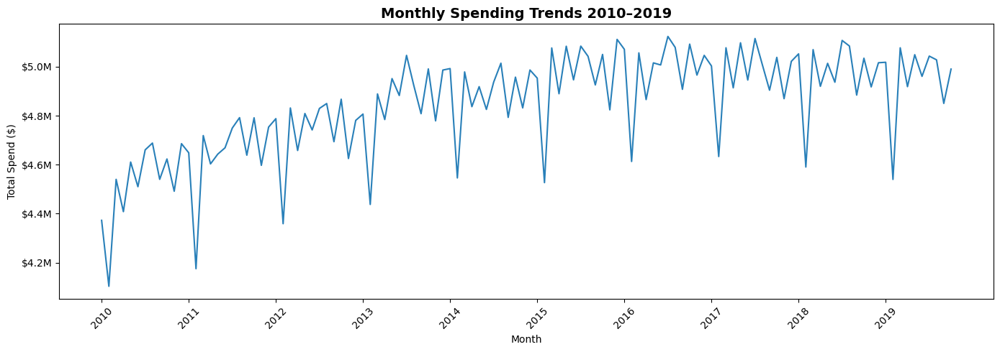

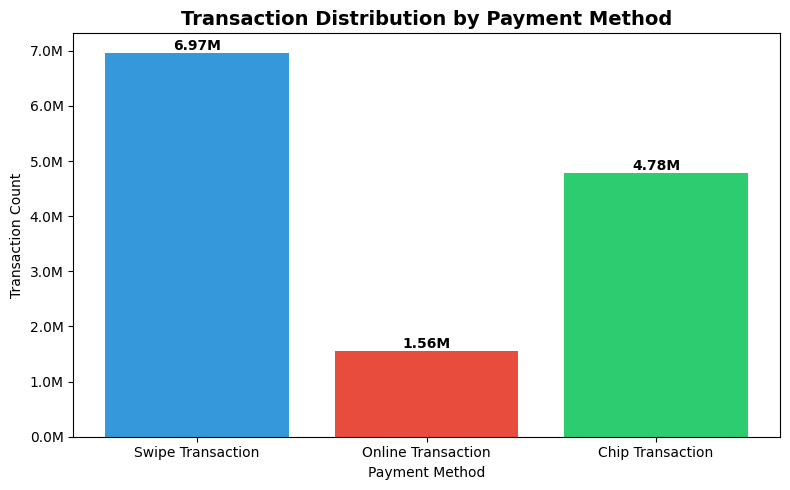

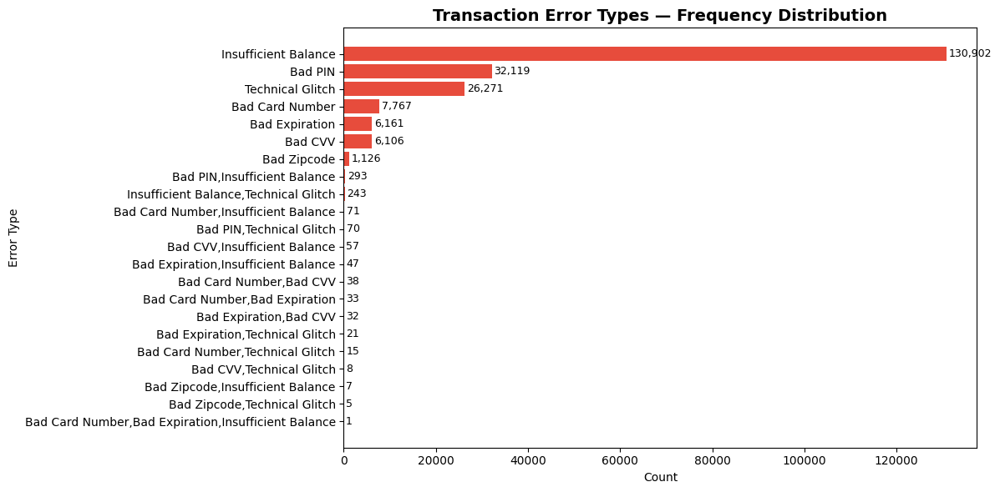

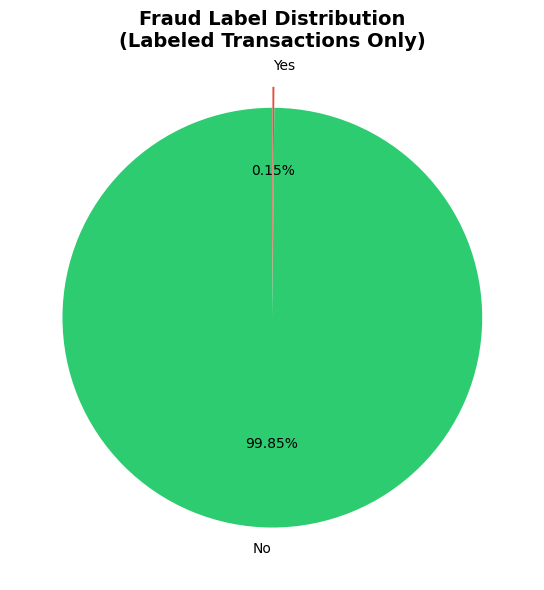

In [0]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import pandas as pd

#Monthly spending trend
monthly_pd = df_transactions.groupBy(
    year("date").alias("year"),
    month("date").alias("month")
).agg(
    spark_sum("amount_clean").alias("total_spent")
).orderBy("year", "month").toPandas()

monthly_pd["period"] = monthly_pd["year"].astype(str) + "-" + \
    monthly_pd["month"].astype(str).str.zfill(2)

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(monthly_pd["period"], monthly_pd["total_spent"],
        color="#2980b9", linewidth=1.5)
ax.set_title("Monthly Spending Trends 2010–2019",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Total Spend ($)")
ax.set_xlabel("Month")
tick_positions = [i for i, p in enumerate(monthly_pd["period"])
                  if p.endswith("-01")]
ax.set_xticks(tick_positions)
ax.set_xticklabels(
    [monthly_pd["period"].iloc[i][:4] for i in tick_positions],
    rotation=45
)
ax.yaxis.set_major_formatter(
    mticker.FuncFormatter(lambda x, _: f"${x/1e6:.1f}M")
)
plt.tight_layout()
plt.show()

#use_chip distribution
chip_pd = df_transactions.groupBy("use_chip").count().toPandas()

fig, ax = plt.subplots(figsize=(8, 5))
colors = ["#3498db", "#e74c3c", "#2ecc71"]
bars = ax.bar(chip_pd["use_chip"], chip_pd["count"], color=colors)
ax.set_title("Transaction Distribution by Payment Method",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Transaction Count")
ax.set_xlabel("Payment Method")
ax.yaxis.set_major_formatter(
    mticker.FuncFormatter(lambda x, _: f"{x/1e6:.1f}M")
)
for bar in bars:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 50000,
        f"{bar.get_height()/1e6:.2f}M",
        ha="center", fontsize=10, fontweight="bold"
    )
plt.tight_layout()
plt.show()

#Errors value counts
errors_pd = df_transactions.groupBy("errors").count() \
    .filter(col("errors").isNotNull()) \
    .orderBy("count", ascending=False).toPandas()

fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.barh(errors_pd["errors"], errors_pd["count"],
               color="#e74c3c")
ax.set_title("Transaction Error Types — Frequency Distribution",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Count")
ax.set_ylabel("Error Type")
ax.invert_yaxis()
for bar in bars:
    ax.text(
        bar.get_width() + 500,
        bar.get_y() + bar.get_height() / 2,
        f"{int(bar.get_width()):,}",
        va="center", fontsize=9
    )
plt.tight_layout()
plt.show()

# Fraud label distribution 
fraud_pd = df_fraud_parsed.groupBy("is_fraud").count().toPandas()

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(
    fraud_pd["count"],
    labels=fraud_pd["is_fraud"],
    autopct="%1.2f%%",
    colors=["#2ecc71", "#e74c3c"],
    startangle=90,
    explode=[0, 0.1]
)
ax.set_title("Fraud Label Distribution\n(Labeled Transactions Only)",
             fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

#card patterns

In [0]:
from pyspark.sql.functions import regexp_replace, col, split

# 1️⃣ Clean numeric columns
df_cards = df_cards.withColumn(
    "credit_limit_clean",
    regexp_replace(col("credit_limit"), "[$,]", "").cast("double")
).withColumn(
    "num_cards_issued_clean",
    regexp_replace(col("num_cards_issued"), "[$,]", "").cast("double")
)

# 2️⃣ Card brand and card type distribution
df_cards.groupBy("card_brand", "card_type").count().display()

# 3️⃣ Card expiry by brand
df_cards.groupBy(
    "card_brand",
    split(col("expires"), "/").getItem(1).alias("expiry_year")
).count().orderBy("card_brand", "expiry_year").display()


# 4️⃣ has_chip by card brand
df_cards.groupBy("card_brand", "has_chip").count().display()

# 5️⃣ num_cards_issued by card type (use cleaned column)
df_cards.groupBy("card_type").agg({"num_cards_issued_clean": "sum"}).display()

# 6️⃣ credit_limit by card type (use cleaned column)
df_cards.groupBy("card_type").agg({"credit_limit_clean": "avg"}).display()

# 7️⃣ card_on_dark_web by card brand
df_cards.groupBy("card_brand", "card_on_dark_web").count().display()
#check all unique values in card_on_dark_web
df_cards.select("card_on_dark_web").distinct().display()

#check count of each value including case variations
df_cards.groupBy("card_on_dark_web").count().display()

card_brand,card_type,count
Discover,Credit,209
Visa,Debit,1320
Amex,Credit,402
Mastercard,Debit,2191
Mastercard,Debit (Prepaid),383
Visa,Debit (Prepaid),195
Visa,Credit,811
Mastercard,Credit,635


card_brand,expiry_year,count
Amex,1999,1
Amex,2001,1
Amex,2003,2
Amex,2005,2
Amex,2007,2
Amex,2008,1
Amex,2009,8
Amex,2010,5
Amex,2011,2
Amex,2012,9


card_brand,has_chip,count
Discover,NO,20
Discover,YES,189
Mastercard,YES,2868
Visa,NO,250
Mastercard,NO,341
Amex,YES,367
Amex,NO,35
Visa,YES,2076


card_type,sum(num_cards_issued_clean)
Credit,3109.0
Debit (Prepaid),873.0
Debit,5256.0


card_type,avg(credit_limit_clean)
Credit,11174.380165289256
Debit (Prepaid),64.44809688581314
Debit,18557.88863571632


card_brand,card_on_dark_web,count
Mastercard,No,3209
Discover,No,209
Amex,No,402
Visa,No,2326


card_on_dark_web
No


card_on_dark_web,count
No,6146


Card brand and card type distribution
Mastercard Debit dominates at 2,191 cards followed by Visa Debit at 1,320. Amex is purely credit. Discover only appears as credit at 209 cards making it the smallest brand. Prepaid debit exists for both Visa and Mastercard but not Amex or Discover
has_chip by card brand
Chipless cards exist across all brands. Mastercard has the most chipless cards at 341, Visa at 250, Amex at 35, Discover at 20
num_cards_issued by card type
Debit cards have the highest total issued at 5,256, Credit at 3,109, Prepaid at 873
credit_limit by card type
Debit cards average $18,557 which is actually higher than Credit cards at $11,174 which is counteintuitive. the conclusion here is that for debits represents account balance ceilings
key thing to note is the card on dark web column- column contained no variation and was excluded from analysis


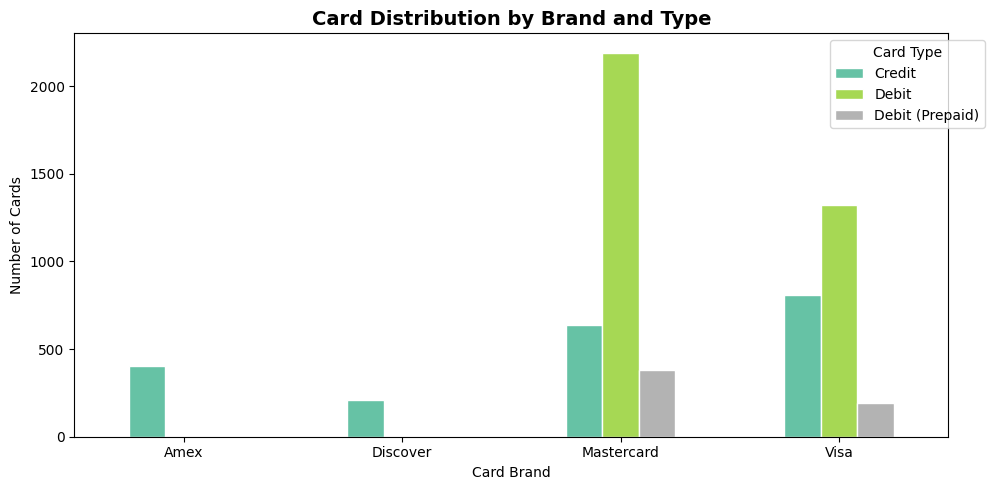

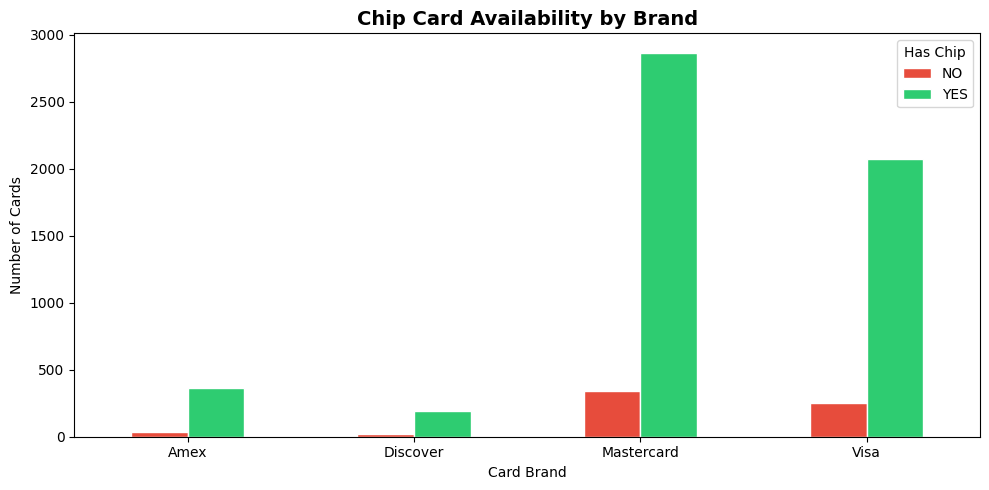

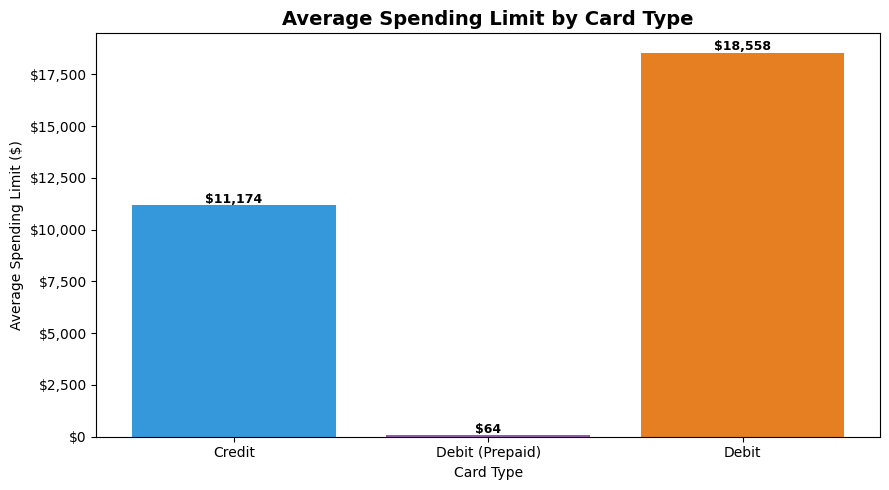

In [0]:
#Card brand and type distribution 
card_brand_pd = df_cards.groupBy("card_brand", "card_type") \
    .count().toPandas()

fig, ax = plt.subplots(figsize=(10, 5))
pivot = card_brand_pd.pivot(
    index="card_brand", columns="card_type", values="count"
).fillna(0)
pivot.plot(kind="bar", ax=ax, colormap="Set2", edgecolor="white")
ax.set_title("Card Distribution by Brand and Type",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Number of Cards")
ax.set_xlabel("Card Brand")
ax.legend(title="Card Type", bbox_to_anchor=(1.05, 1))
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#has_chip by card brand
chip_brand_pd = df_cards.groupBy("card_brand", "has_chip") \
    .count().toPandas()

fig, ax = plt.subplots(figsize=(10, 5))
pivot2 = chip_brand_pd.pivot(
    index="card_brand", columns="has_chip", values="count"
).fillna(0)
pivot2.plot(kind="bar", ax=ax,
            color=["#e74c3c", "#2ecc71"], edgecolor="white")
ax.set_title("Chip Card Availability by Brand",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Number of Cards")
ax.set_xlabel("Card Brand")
ax.legend(title="Has Chip")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#Average spending limit by card type 
limit_pd = df_cards.withColumn(
    "spending_limit",
    regexp_replace(col("credit_limit"), "[$,]", "").cast("double")
).groupBy("card_type").agg(
    avg("spending_limit").alias("avg_spending_limit")
).toPandas()

fig, ax = plt.subplots(figsize=(9, 5))
bars = ax.bar(
    limit_pd["card_type"],
    limit_pd["avg_spending_limit"],
    color=["#3498db", "#9b59b6", "#e67e22"]
)
ax.set_title("Average Spending Limit by Card Type",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Average Spending Limit ($)")
ax.set_xlabel("Card Type")
ax.yaxis.set_major_formatter(
    mticker.FuncFormatter(lambda x, _: f"${x:,.0f}")
)
for bar in bars:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 100,
        f"${bar.get_height():,.0f}",
        ha="center", fontsize=9, fontweight="bold"
    )
plt.tight_layout()
plt.show()

#customer demographics

In [0]:
from pyspark.sql.functions import col, regexp_replace

# 1️⃣ Clean numeric columns if they have $ or commas
df_users = df_users.withColumn(
    "yearly_income_clean",
    regexp_replace(col("yearly_income"), "[$,]", "").cast("double")
).withColumn(
    "total_debt_clean",
    regexp_replace(col("total_debt"), "[$,]", "").cast("double")
).withColumn(
    "debt_to_income_ratio_clean",
    col("total_debt_clean") / col("yearly_income_clean")
)

# 2️⃣ Age distribution by gender
df_users.groupBy("gender").agg({"current_age": "avg"}).display()

# 3️⃣ Years to retirement by gender
df_users = df_users.withColumn("years_to_retirement", col("retirement_age") - col("current_age"))
df_users.groupBy("gender").agg({"years_to_retirement": "avg"}).display()

# 4️⃣ Yearly income by age group and gender
df_users.groupBy("gender", "current_age").agg({"yearly_income_clean": "avg"}).display()

# 5️⃣ Debt to income ratio by age group and gender
df_users.groupBy("gender", "current_age").agg({"debt_to_income_ratio_clean": "avg"}).display()

# 6️⃣ Credit score by age group
df_users.groupBy("current_age").agg({"credit_score": "avg"}).display()

# 7️⃣ num_credit_cards by age group
df_users.groupBy("current_age").agg({"num_credit_cards": "avg"}).display()

gender,avg(current_age)
Female,45.98917322834646
Male,44.77439024390244


gender,avg(years_to_retirement)
Female,20.221456692913385
Male,21.490853658536587


gender,current_age,avg(yearly_income_clean)
Female,92,42139.0
Male,72,32842.0
Female,47,44504.08
Male,79,35513.142857142855
Female,20,46428.166666666664
Female,35,44403.68421052631
Female,84,54348.333333333336
Female,99,51110.0
Female,65,46502.5
Female,90,37998.75


gender,current_age,avg(debt_to_income_ratio_clean)
Female,92,0.06629322995743017
Male,72,0.38891278014541364
Female,47,1.5966516093150225
Male,79,0.48563192862174887
Female,20,1.7359836983909198
Female,35,1.8051816146350128
Female,84,0.07851685406742119
Female,99,0.07397769516728625
Female,65,0.7326446523668235
Female,90,0.03754788213175302


current_age,avg(credit_score)
31,697.4473684210526
85,690.7777777777778
65,707.4736842105264
53,696.8611111111111
78,679.0
34,699.3333333333334
101,761.0
81,693.0909090909091
28,705.2380952380952
76,714.6


current_age,avg(num_credit_cards)
31,2.473684210526316
85,4.666666666666667
65,3.3157894736842106
53,3.3333333333333335
78,5.454545454545454
34,2.566666666666667
101,4.0
81,5.0
28,2.0714285714285716
76,4.066666666666666


Age distribution by gender
Female average age is 46.0, Male is 44.8 
Years to retirement by gender
Females average 20.2 years to retirement, Males average 21.5 years
Yearly income by age group and gender
Some of the highest incomes appear in younger age groups — Female 23 averages $60,448, Male 94 averages $60,080. Older customers (75+) generally show lower incomes — Male 85 averages $27,157, Female 77 averages $28,883 — likely reflecting retirement and fixed income. Male 80 shows an outlier at $104,692 which is significantly higher than surrounding age groups and worth investigating
Debt to income ratio by age group and gender
There is a very clear and consistent age pattern: younger customers (18-65) have debt to income ratios consistently above 1.0, often between 1.3 and 1.9. Older customers (75+) drop dramatically to below 0.1
Credit score by age group
The output shown is partial but the pattern is visible — credit scores are relatively stable across age groups, mostly ranging between 679 and 761. The 101 year old showing 761 and the 91 year old showing 783 suggest older customers have slightly higher scores
num_credit_cards by age group
older customers hold significantly more credit cards. Age 99 averages 8 cards, age 93 averages 7, age 92 averages 6.75, age 94 averages 6. Younger customers age 18-25 average only 1.9-2.4 cards.

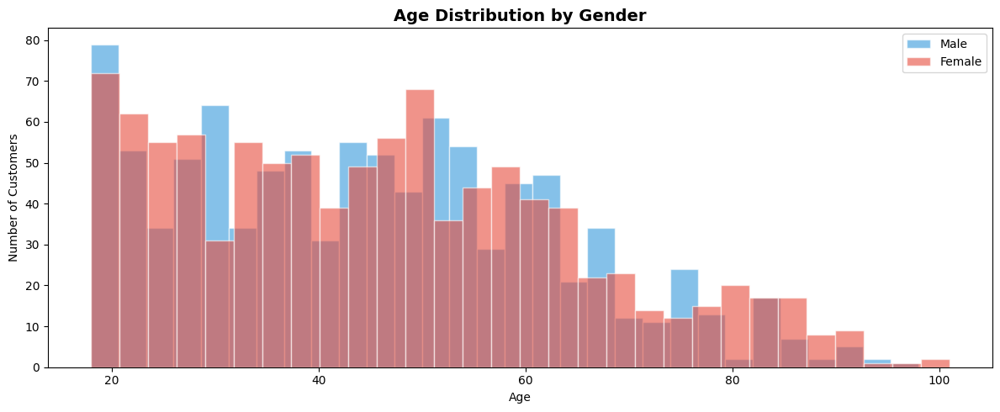

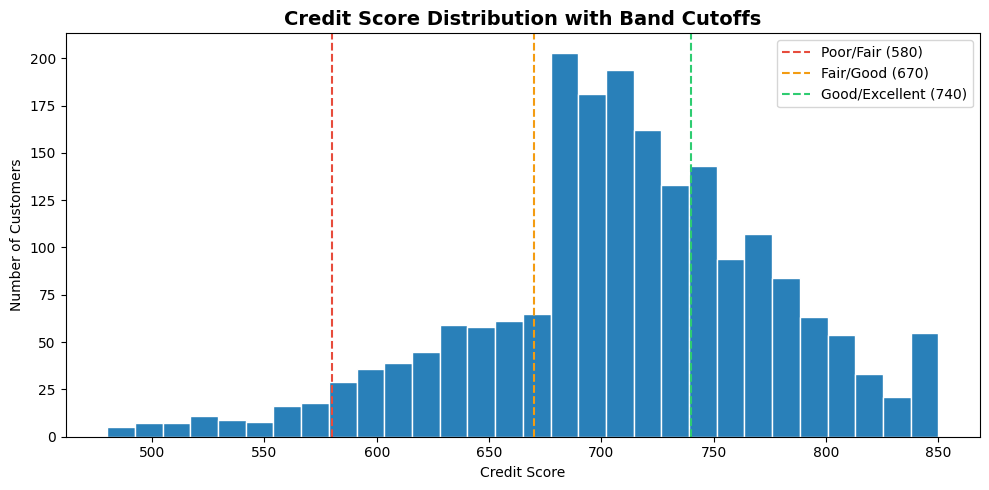

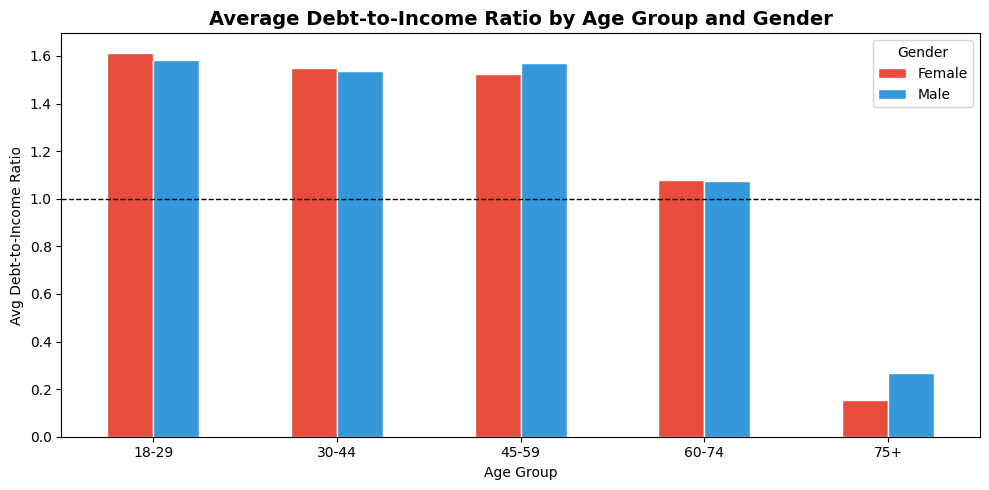

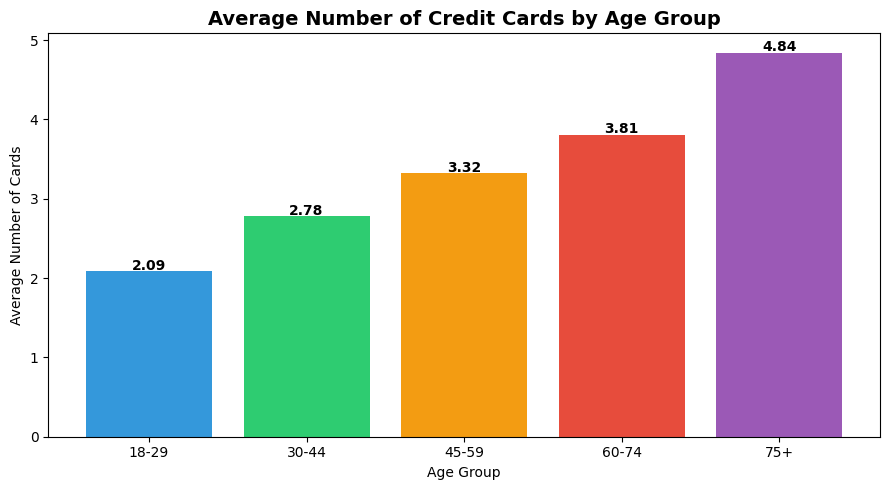

In [0]:
#Age distribution by gender
age_pd = df_users.toPandas()

fig, ax = plt.subplots(figsize=(12, 5))
for gender, color in [("Male", "#3498db"), ("Female", "#e74c3c")]:
    subset = age_pd[age_pd["gender"] == gender]["current_age"]
    ax.hist(subset, bins=30, alpha=0.6, label=gender,
            color=color, edgecolor="white")
ax.set_title("Age Distribution by Gender",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Age")
ax.set_ylabel("Number of Customers")
ax.legend()
plt.tight_layout()
plt.show()

#Credit score distribution
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(age_pd["credit_score"], bins=30,
        color="#2980b9", edgecolor="white")
ax.axvline(580, color="#e74c3c", linestyle="--",
           linewidth=1.5, label="Poor/Fair (580)")
ax.axvline(670, color="#f39c12", linestyle="--",
           linewidth=1.5, label="Fair/Good (670)")
ax.axvline(740, color="#2ecc71", linestyle="--",
           linewidth=1.5, label="Good/Excellent (740)")
ax.set_title("Credit Score Distribution with Band Cutoffs",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Credit Score")
ax.set_ylabel("Number of Customers")
ax.legend()
plt.tight_layout()
plt.show()

#Debt to income ratio by age group
from pyspark.sql.functions import regexp_replace

df_users_clean = df_users.withColumn(
    "yearly_income_clean",
    regexp_replace(col("yearly_income"), "[$,]", "").cast("double")
).withColumn(
    "total_debt_clean",
    regexp_replace(col("total_debt"), "[$,]", "").cast("double")
).withColumn(
    "debt_to_income",
    col("total_debt_clean") / col("yearly_income_clean")
).withColumn(
    "age_group",
    when(col("current_age") < 30, "18-29")
    .when(col("current_age") < 45, "30-44")
    .when(col("current_age") < 60, "45-59")
    .when(col("current_age") < 75, "60-74")
    .otherwise("75+")
)

dti_pd = df_users_clean.groupBy("age_group", "gender").agg(
    avg("debt_to_income").alias("avg_dti")
).toPandas()

fig, ax = plt.subplots(figsize=(10, 5))
pivot3 = dti_pd.pivot(
    index="age_group", columns="gender", values="avg_dti"
).reindex(["18-29", "30-44", "45-59", "60-74", "75+"])
pivot3.plot(kind="bar", ax=ax,
            color=["#e74c3c", "#3498db"], edgecolor="white")
ax.set_title("Average Debt-to-Income Ratio by Age Group and Gender",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Avg Debt-to-Income Ratio")
ax.set_xlabel("Age Group")
ax.legend(title="Gender")
ax.axhline(1.0, color="black", linestyle="--",
           linewidth=1, label="Ratio = 1.0")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#Num credit cards by age group
cards_age_pd = df_users_clean.groupBy("age_group").agg(
    avg("num_credit_cards").alias("avg_num_cards")
).toPandas().sort_values("age_group")

fig, ax = plt.subplots(figsize=(9, 5))
bars = ax.bar(
    cards_age_pd["age_group"],
    cards_age_pd["avg_num_cards"],
    color=["#3498db", "#2ecc71", "#f39c12", "#e74c3c", "#9b59b6"]
)
ax.set_title("Average Number of Credit Cards by Age Group",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Average Number of Cards")
ax.set_xlabel("Age Group")
for bar in bars:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.02,
        f"{bar.get_height():.2f}",
        ha="center", fontsize=10, fontweight="bold"
    )
plt.tight_layout()
plt.show()

#cross join investigations

In [0]:
from pyspark.sql.functions import col, regexp_replace

# Checking for bad values that became NULL
df_transactions.filter(col("amount_clean").isNull()).display()

id,date,client_id,card_id,amount,use_chip,merchant_id,merchant_city,merchant_state,zip,mcc,errors,transaction_date,amount_clean,days_since_last


In [0]:
from pyspark.sql.functions import regexp_replace

# Recreate cleaned columns on df_users
df_users = df_users.withColumn(
    "yearly_income_clean",
    regexp_replace(col("yearly_income"), "[$,]", "").cast("double")
).withColumn(
    "total_debt_clean",
    regexp_replace(col("total_debt"), "[$,]", "").cast("double")
)

# Recreate cleaned column on df_cards
df_cards = df_cards.withColumn(
    "credit_limit_clean",
    regexp_replace(col("credit_limit"), "[$,]", "").cast("double")
)

# Confirm
df_users.select("yearly_income", "yearly_income_clean").show(3)
df_cards.select("credit_limit", "credit_limit_clean").show(3)

+-------------+-------------------+
|yearly_income|yearly_income_clean|
+-------------+-------------------+
|       $59696|            59696.0|
|       $77254|            77254.0|
|       $33483|            33483.0|
+-------------+-------------------+
only showing top 3 rows

+------------+------------------+
|credit_limit|credit_limit_clean|
+------------+------------------+
|      $24295|           24295.0|
|      $21968|           21968.0|
|      $46414|           46414.0|
+------------+------------------+
only showing top 3 rows



In [0]:
#cast is_fraud to match transaction id type
df_fraud_parsed = df_fraud_parsed.withColumnRenamed(
    "transaction_id", "fraud_transaction_id"
)
#join the datasets
df_joined = df_transactions \
    .join(
        df_fraud_parsed,
        df_transactions.id == df_fraud_parsed.fraud_transaction_id,
        how="left"
    ) \
    .join(
        df_cards.select("id", "card_brand", "card_type", 
                        "has_chip", "card_on_dark_web",
                        "credit_limit_clean"),
        df_transactions.card_id == df_cards.id,
        how="left"
    ) \
    .join(
        df_users.select("id", "credit_score", "current_age",
                        "gender", "yearly_income_clean",
                        "total_debt_clean"),
        df_transactions.client_id == df_users.id,
        how="left"
    )
print(f"Joined row count: {df_joined.count()}")
df_joined.printSchema()

Joined row count: 13305915
root
 |-- id: integer (nullable = true)
 |-- date: timestamp (nullable = true)
 |-- client_id: integer (nullable = true)
 |-- card_id: integer (nullable = true)
 |-- amount: string (nullable = true)
 |-- use_chip: string (nullable = true)
 |-- merchant_id: integer (nullable = true)
 |-- merchant_city: string (nullable = true)
 |-- merchant_state: string (nullable = true)
 |-- zip: double (nullable = true)
 |-- mcc: integer (nullable = true)
 |-- errors: string (nullable = true)
 |-- transaction_date: timestamp (nullable = true)
 |-- amount_clean: double (nullable = true)
 |-- days_since_last: integer (nullable = true)
 |-- fraud_transaction_id: long (nullable = true)
 |-- is_fraud: string (nullable = true)
 |-- id: integer (nullable = true)
 |-- card_brand: string (nullable = true)
 |-- card_type: string (nullable = true)
 |-- has_chip: string (nullable = true)
 |-- card_on_dark_web: string (nullable = true)
 |-- credit_limit_clean: double (nullable = true)
 

In [0]:
from pyspark.sql.functions import when, col, avg

#fraud rate by use_chip- tell us if online,swipe or chip transactions have higher fraud rates
df_joined.filter(col("is_fraud").isNotNull()) \
    .groupBy("use_chip") \
    .agg(
        count(when(col("is_fraud") == "Yes", True)).alias("fraud_count"),
        count("*").alias("total_count")
    ).withColumn(
        "fraud_rate_pct",
        (col("fraud_count") / col("total_count") * 100).cast("double")
    ).orderBy("fraud_rate_pct", ascending=False).display()

# churn risk proxy by credit score band
#bin the credit score into bands then group credit band by average days between transactions
df_joined.withColumn(
    "credit_band",
    when(col("credit_score") < 580, "Poor")
    .when(col("credit_score") < 670, "Fair")
    .when(col("credit_score") < 740, "Good")
    .otherwise("Excellent")
).groupBy("credit_band").agg(
    avg("days_since_last").alias("avg_days_between_transactions"),
    count("*").alias("transaction_count")
).orderBy("avg_days_between_transactions", ascending=False).display()


use_chip,fraud_count,total_count,fraud_rate_pct
Online Transaction,8779,1043975,0.8409205201273976
Chip Transaction,3176,3202776,0.09916397525146935
Swipe Transaction,1377,4668212,0.029497375012103134


credit_band,avg_days_between_transactions,transaction_count
Good,0.3280393106622658,6309718
Fair,0.32422165648883106,1926098
Excellent,0.3093858574640557,4592581
Poor,0.29722331593629836,477518


**Fraud rate by use_chip**
Online transactions have a fraud rate of 0.84% — higher than Chip transactions at 0.099% and higher than Swipe at 0.029%.
**Churn risk proxy by credit score band
**there is almost no difference in transaction frequency across credit score bands. Good averages 0.328 days, Fair 0.324, Excellent 0.309, Poor 0.297. The differences are tiny and the ordering is counterintuitive — Poor credit customers actually transact slightly more frequently than Excellent ones.

In [0]:

# dark web exposure vs transaction frequency
#group the card_on_dark_web column then calculate average days between transactions for each group
df_joined.groupBy("card_on_dark_web").agg(
    avg("days_since_last").alias("avg_days_between_transactions"),
    count("*").alias("transaction_count")
).display()

#error rate per customer
#groups by customer and counts two things — how many of their transactions had an error and their total transaction count. Then divide error count by total to get each customer's personal error rate as a percentage
df_joined.groupBy("client_id").agg(
    count(when(col("errors").isNotNull(), True)).alias("error_count"),
    count("*").alias("total_transactions"),
).withColumn(
    "error_rate_pct",
    (col("error_count") / col("total_transactions") * 100).cast("double")
).orderBy("error_rate_pct", ascending=False).display()

card_on_dark_web,avg_days_between_transactions,transaction_count
No,0.31994244738850103,13305915


client_id,error_count,total_transactions,error_rate_pct
954,2935,20047,14.640594602683693
1189,478,7474,6.395504415306395
363,543,9832,5.522782750203417
1424,822,15412,5.3335063586815465
1888,2109,40105,5.2586959232015955
248,256,5763,4.442130834634739
464,1196,27619,4.330352293710852
1552,297,6979,4.255624014901849
1305,371,8924,4.157328552218735
1094,219,5305,4.12818096135721


** Dark web exposure vs transaction frequency**
Confirms the column has zero analytical value

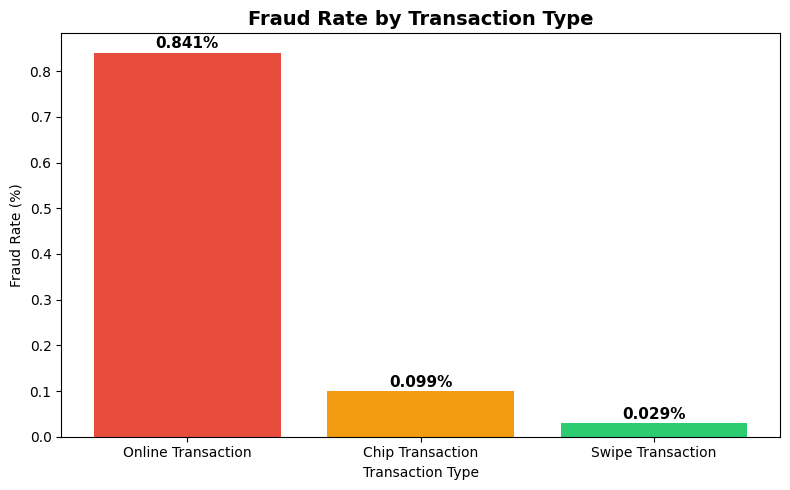

In [0]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

# fraud rate by use_chip
fraud_chip_data = {
    "Online Transaction": 0.841,
    "Chip Transaction": 0.099,
    "Swipe Transaction": 0.029
}

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(
    fraud_chip_data.keys(),
    fraud_chip_data.values(),
    color=["#e74c3c", "#f39c12", "#2ecc71"]
)
ax.set_title("Fraud Rate by Transaction Type", fontsize=14, fontweight="bold")
ax.set_ylabel("Fraud Rate (%)")
ax.set_xlabel("Transaction Type")
for bar in bars:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.01,
        f"{bar.get_height():.3f}%",
        ha="center", fontsize=11, fontweight="bold"
    )
plt.tight_layout()
plt.show()


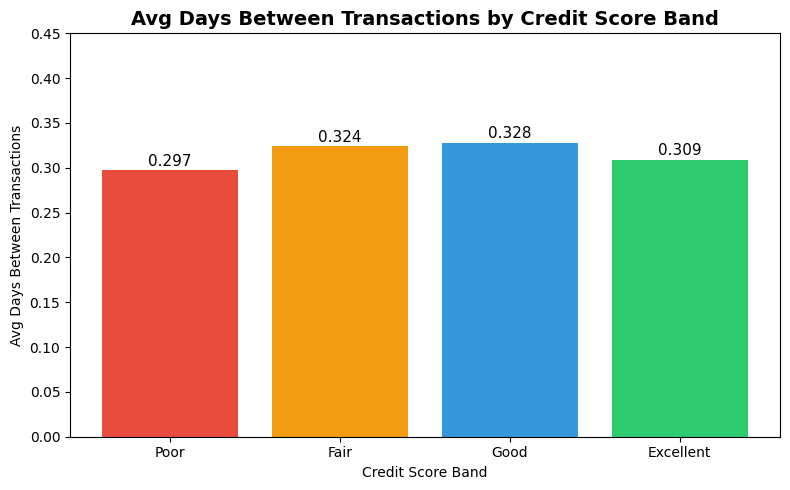

In [0]:
#churn risk proxy by credit score band 
bands = ["Poor", "Fair", "Good", "Excellent"]
avg_days = [0.297, 0.324, 0.328, 0.309]

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(bands, avg_days, color=["#e74c3c", "#f39c12", "#3498db", "#2ecc71"])
ax.set_title("Avg Days Between Transactions by Credit Score Band",
             fontsize=14, fontweight="bold")
ax.set_ylabel("Avg Days Between Transactions")
ax.set_xlabel("Credit Score Band")
ax.set_ylim(0, 0.45)
for bar in bars:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.005,
        f"{bar.get_height():.3f}",
        ha="center", fontsize=11
    )
plt.tight_layout()
plt.show()

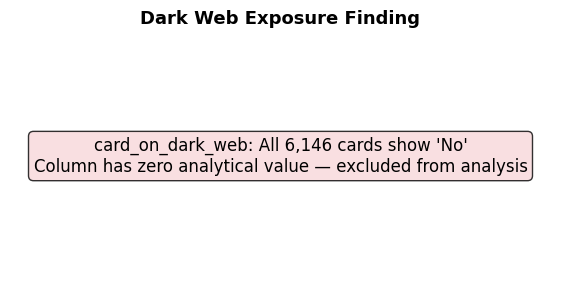

In [0]:
# card_on_dark_web note
fig, ax = plt.subplots(figsize=(6, 3))
ax.text(
    0.5, 0.5,
    "card_on_dark_web: All 6,146 cards show 'No'\nColumn has zero analytical value — excluded from analysis",
    ha="center", va="center", fontsize=12,
    bbox=dict(boxstyle="round", facecolor="#f8d7da", alpha=0.8)
)
ax.axis("off")
ax.set_title("Dark Web Exposure Finding", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

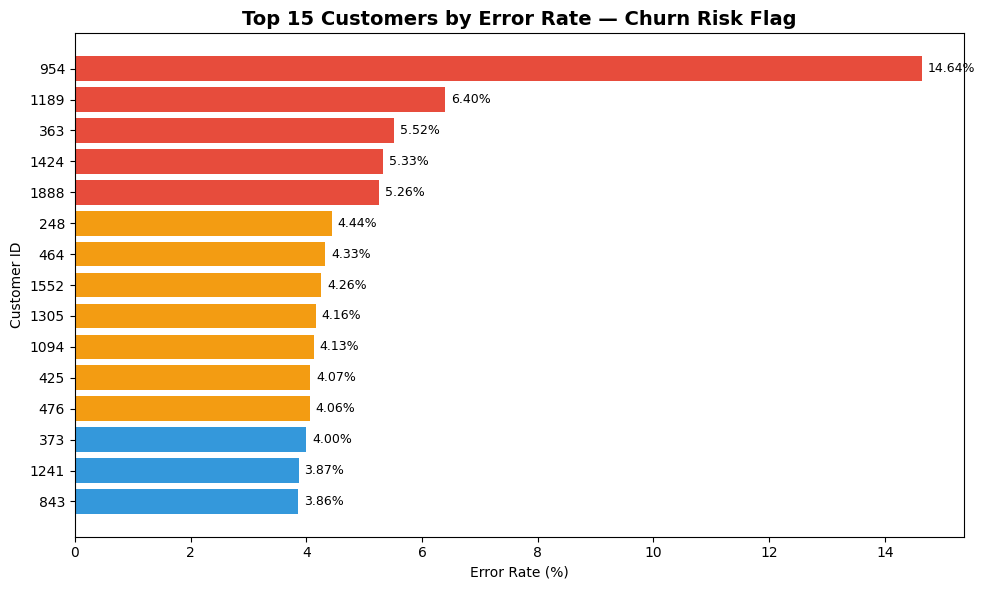

In [0]:
#top 15 customers by error rate
top_error_customers = {
    "954": 14.64, "1189": 6.40, "363": 5.52,
    "1424": 5.33, "1888": 5.26, "248": 4.44,
    "464": 4.33, "1552": 4.26, "1305": 4.16,
    "1094": 4.13, "425": 4.07, "476": 4.06,
    "373": 4.00, "1241": 3.87, "843": 3.86
}

fig, ax = plt.subplots(figsize=(10, 6))
colors = ["#e74c3c" if v > 5 else "#f39c12" if v > 4 else "#3498db"
          for v in top_error_customers.values()]
bars = ax.barh(
    list(top_error_customers.keys()),
    list(top_error_customers.values()),
    color=colors
)
ax.set_title("Top 15 Customers by Error Rate — Churn Risk Flag",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Error Rate (%)")
ax.set_ylabel("Customer ID")
ax.invert_yaxis()
for bar in bars:
    ax.text(
        bar.get_width() + 0.1,
        bar.get_y() + bar.get_height() / 2,
        f"{bar.get_width():.2f}%",
        va="center", fontsize=9
    )
plt.tight_layout()
plt.show()

A small subset of customers show disproportionately high transaction error rates, with one customer experiencing failures on nearly 1 in 7 transactions. These customers represent our highest priority churn intervention targets
The error rate drop-off is steep — from 14.64% to 6.40% is a massive jump, then it gradually decreases from 6.40% down to 3.86%